In [1]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import glob

/home/mwagner/bin/anaconda3/envs/hcprediction/lib/python3.6/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def load_weight_matrices(paths):
    init_weights = []
    final_weights = []

    for path in paths:
        outputs = torch.load(path)
        W_init = outputs["initial_state_dict"]["hidden_linear.weight"].numpy()
        W_final = outputs["final_state_dict"]["hidden_linear.weight"].cpu().numpy()
        init_weights.append(W_init)
        final_weights.append(W_final)

    init_weights = np.stack(init_weights)  # shape: (num_runs, H, H)
    final_weights = np.stack(final_weights)

    avg_init = np.mean(init_weights, axis=0)
    avg_final = np.mean(final_weights, axis=0)
    std_init = np.std(init_weights, axis=0)
    std_final = np.std(final_weights, axis=0)
    delta_W = avg_final - avg_init

    return avg_init, avg_final, std_init, std_final, delta_W

In [3]:
def plot_weight_stats(
    W_init, W_final, std_init, std_final, delta_W, label="UNNAMED", vmax=0.2
):
    fig, axes = plt.subplots(3, 2, figsize=(12, 12))

    # Sort indices by argmax
    idx_init = np.argsort(np.argmax(W_init, axis=1))
    idx_final = np.argsort(np.argmax(W_final, axis=1))

    # Plot mean
    axes[0][0].imshow(
        W_init[idx_init][:, idx_init], cmap="RdBu_r", vmin=-vmax, vmax=vmax
    )
    axes[0][0].set_title(f"Mean Initial ({label})")
    axes[0][1].imshow(
        W_final[idx_final][:, idx_final], cmap="RdBu_r", vmin=-vmax, vmax=vmax
    )
    axes[0][1].set_title(f"Mean Final ({label})")

    # Plot std
    axes[1][0].imshow(std_init[idx_init][:, idx_init], cmap="magma")
    axes[1][0].set_title("STD Initial")
    axes[1][1].imshow(std_final[idx_final][:, idx_final], cmap="magma")
    axes[1][1].set_title("STD Final")

    # Plot difference (final - initial)
    vmax_diff = np.max(np.abs(delta_W))
    axes[2][0].imshow(
        delta_W[idx_init][:, idx_init], cmap="bwr", vmin=-vmax_diff, vmax=vmax_diff
    )
    axes[2][0].set_title("Final - Initial (sorted by init)")
    axes[2][1].imshow(
        delta_W[idx_final][:, idx_final], cmap="bwr", vmin=-vmax_diff, vmax=vmax_diff
    )
    axes[2][1].set_title("Final - Initial (sorted by final)")

    for ax_row in axes:
        for ax in ax_row:
            ax.set_xlabel("Presynaptic Neuron")
            ax.set_ylabel("Postsynaptic Neuron")

    plt.suptitle(f"Weight Matrix Summary: {label}", fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()

In [4]:
def load_losses(paths):
    all_losses = []
    for path in paths:
        outputs = torch.load(path)
        loss = outputs["loss"]
        if isinstance(loss, torch.Tensor):
            loss = loss.cpu().numpy()
        all_losses.append(loss)
    return np.array(all_losses)  # shape: (num_runs, num_epochs)

In [5]:
def plot_all_loss_curves(init_groups, start_x=0):
    plt.figure(figsize=(10, 6))

    colors = plt.cm.tab20.colors[: len(init_groups)]

    i = 0
    for init_name, paths in init_groups.items():
        loss_array = load_losses(paths)
        min_len = min([len(loss) for loss in loss_array])
        loss_array = np.array(
            [loss[:min_len] for loss in loss_array]
        )  # trim to same length

        mean_loss = np.mean(loss_array[:, start_x:], axis=0)
        std_loss = np.std(loss_array[:, start_x:], axis=0)
        x = np.arange(start_x, start_x + mean_loss.shape[0])

        plt.plot(x, mean_loss, label=init_name, color=colors[i])
        plt.fill_between(
            x, mean_loss - std_loss, mean_loss + std_loss, alpha=0.3, color=colors[i]
        )
        i += 1

    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Loss Mean ± Std Across Initializations")
    plt.legend()
    plt.tight_layout()
    plt.show()

In [6]:
# build directory of experiments
init_types = ["xavier", "he", "id", "tridiag", "cyctridiag", "shift", "cycshift"]
exclude_terms = [
    "/cyctridiag-linear",
    "/tridiag-linear",
    "/id-linear",
    "/shift-linear",
    "/shift-tanh",
    "/xavier-linear",
]
batch_sizes = [5, 10]
inits_5 = []
inits_100 = []
init_dirs = []
for i in init_types:
    path_list = sorted(glob.glob(f"../Elman_SGD/predloss/multiruns/{i}/{i}*/batch-*"))
    for p in path_list:
        if any(term in p for term in exclude_terms):
            continue
        if "batch-100" in p:
            inits_100.append(p)
        else:
            inits_5.append(p)

names_5 = [i.split("/")[5] + i.split("batch")[1] for i in inits_5]
names_100 = [i.split("/")[5] + i.split("batch")[1] for i in inits_100]

init_groups_5 = {}
init_groups_100 = {}

for n, i in zip(names_5, inits_5):
    init_groups_5[n] = sorted(glob.glob(i + "/*.pth.tar"))

for n, i in zip(names_100, inits_100):
    init_groups_100[n] = sorted(glob.glob(i + "/*.pth.tar"))

In [7]:
init_groups_5.keys()

dict_keys(['xavier-relu-5', 'xavier-tanh-5', 'he-linear-5', 'he-relu-5', 'he-tanh-5', 'id-relu-5', 'id-tanh-5', 'tridiag-relu-5', 'tridiag-tanh-5', 'cyctridiag-relu-5', 'cyctridiag-tanh-5', 'shift-relu-5', 'cycshift-linear-5', 'cycshift-relu-5', 'cycshift-tanh-5'])

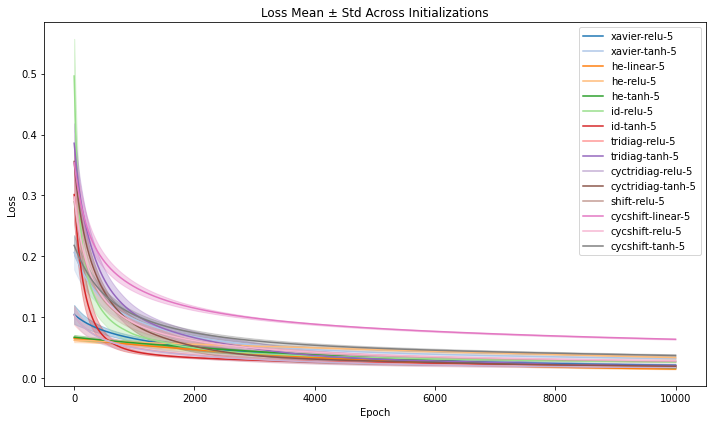

In [8]:
plot_all_loss_curves(init_groups_5, start_x=0)

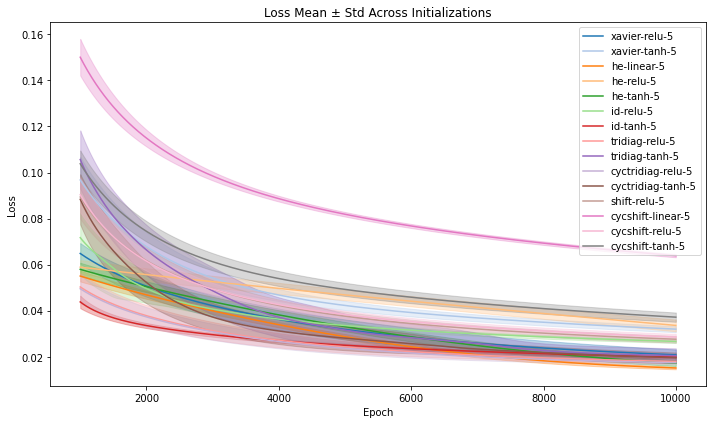

In [9]:
plot_all_loss_curves(init_groups_5, start_x=1000)

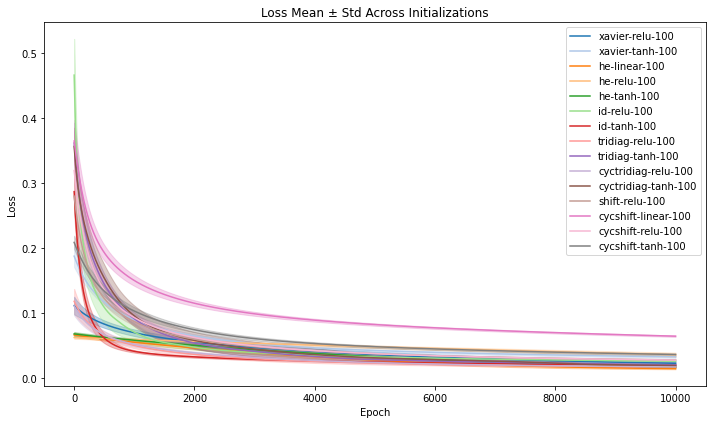

In [10]:
plot_all_loss_curves(init_groups_100, start_x=0)

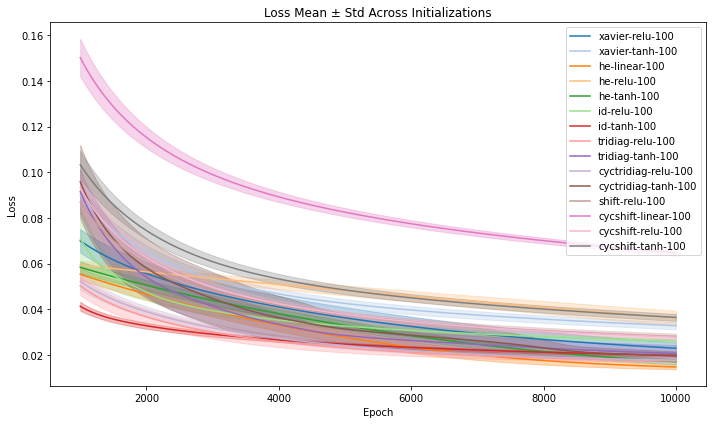

In [11]:
plot_all_loss_curves(init_groups_100, start_x=1000)

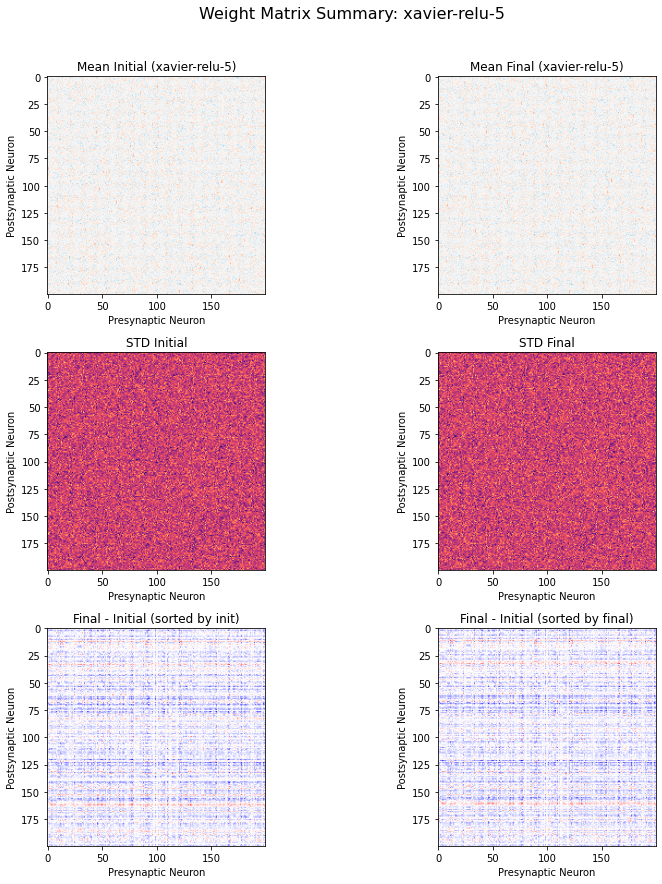

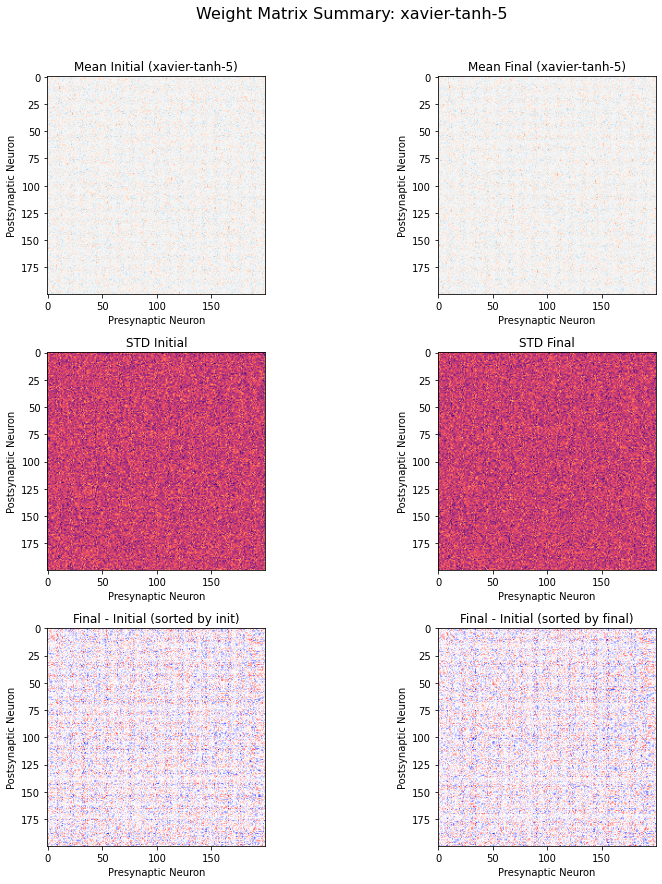

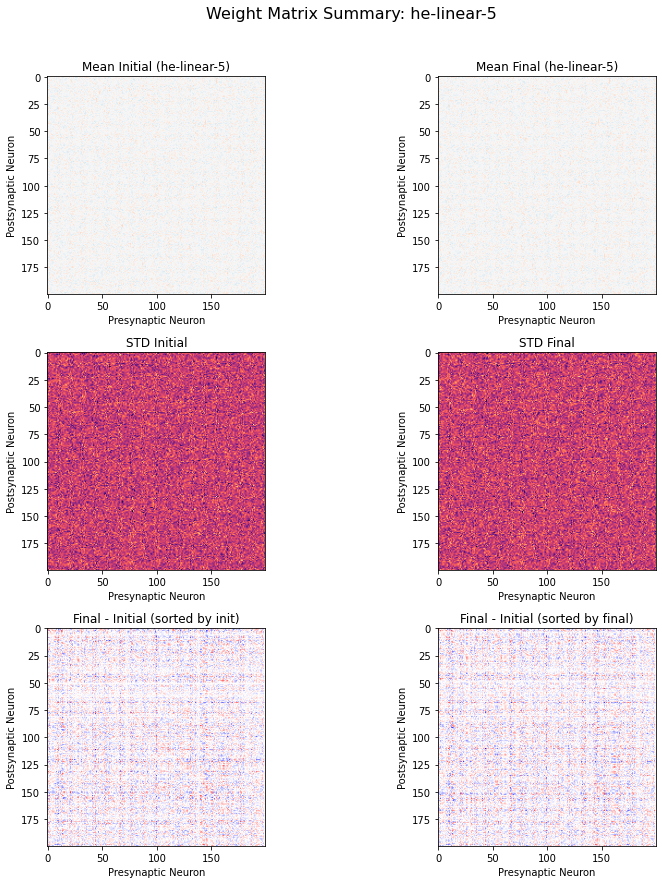

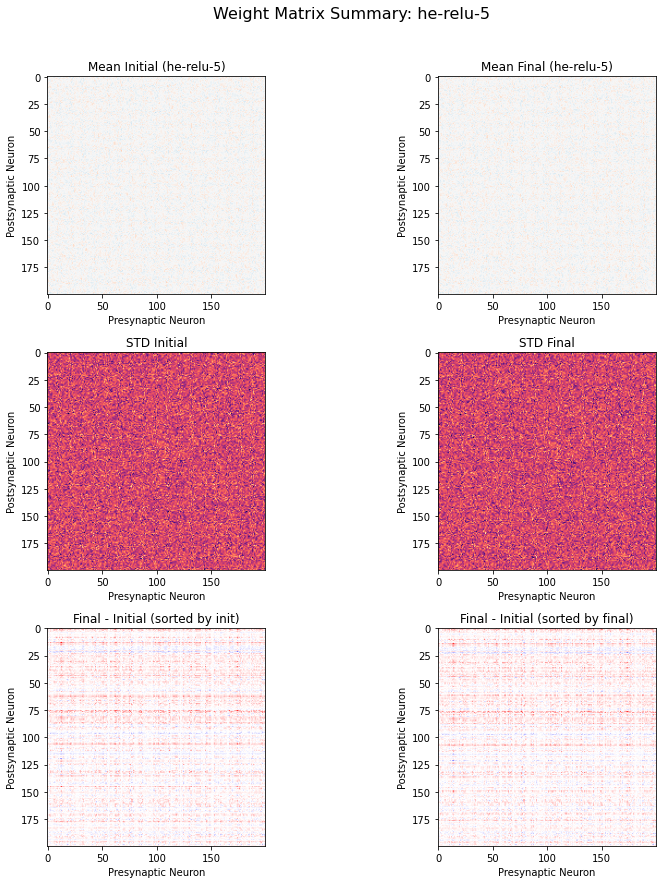

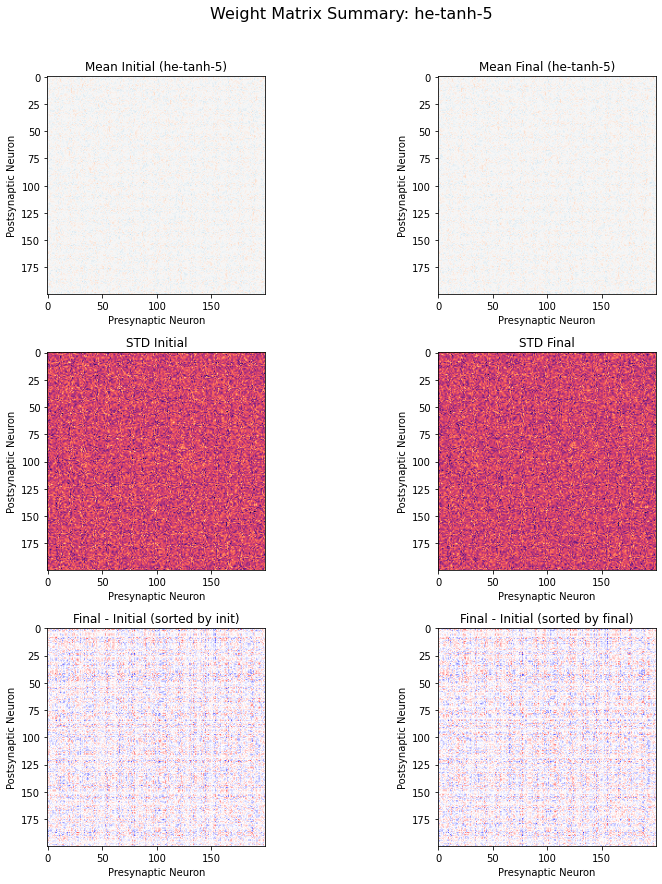

...

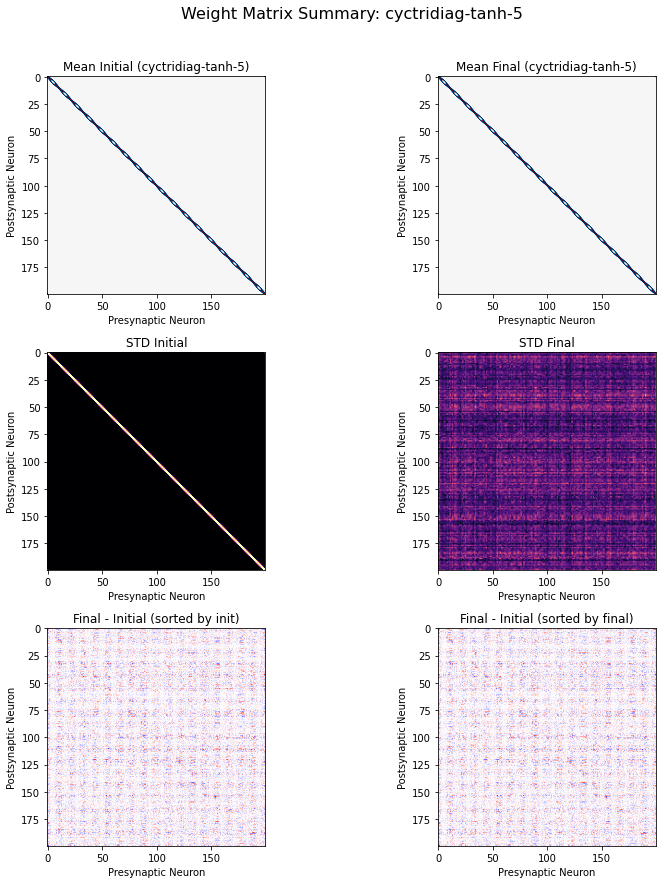

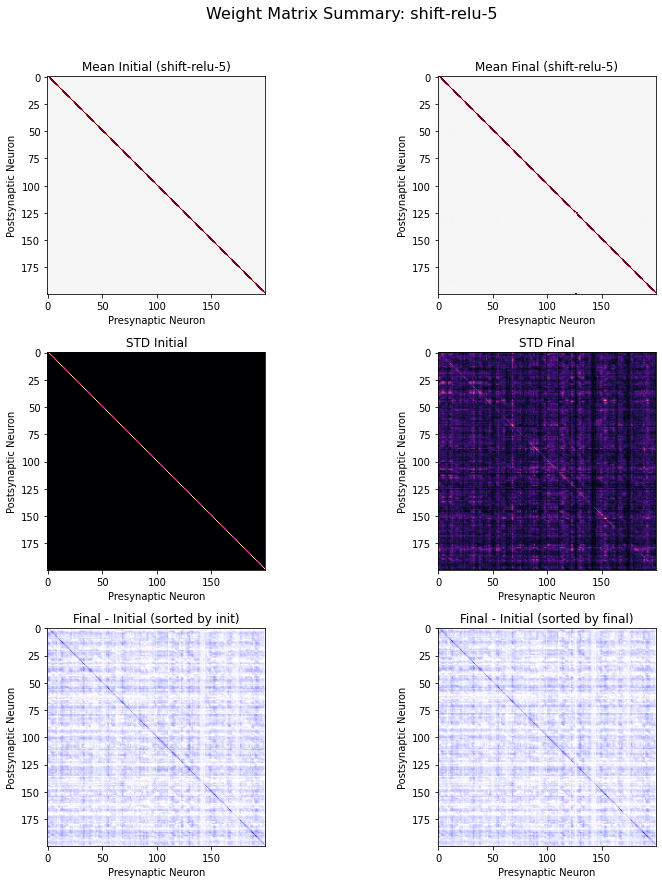

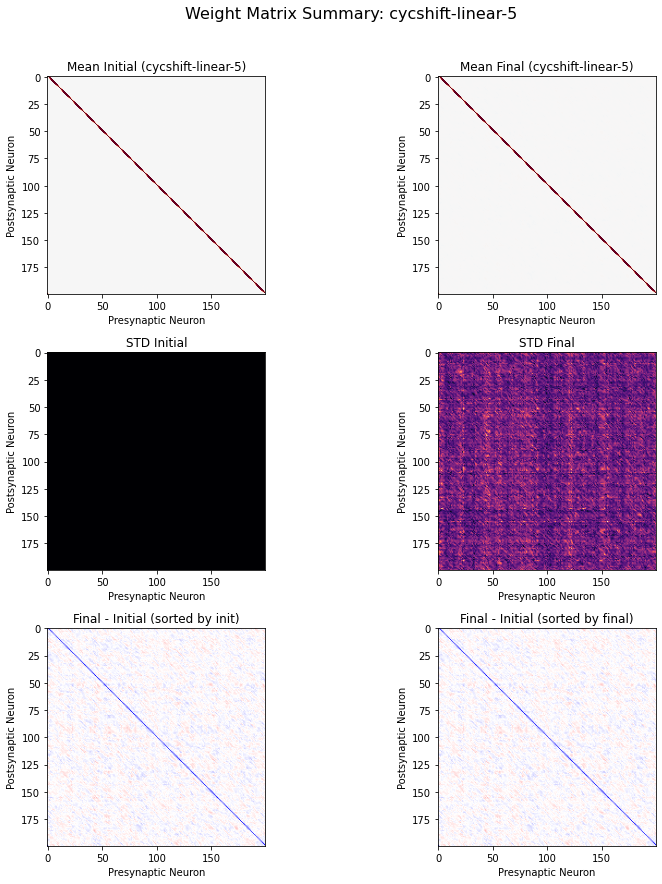

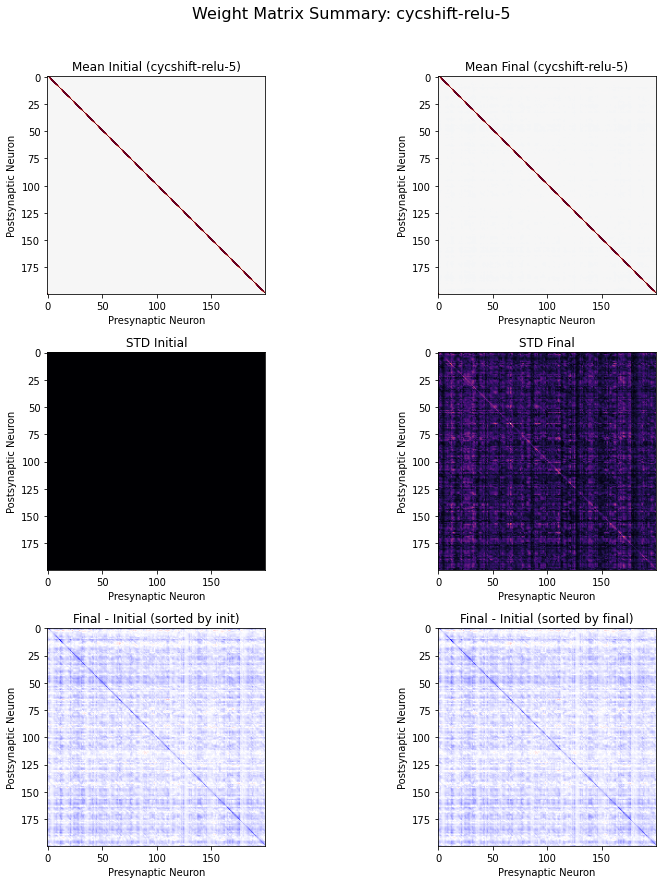

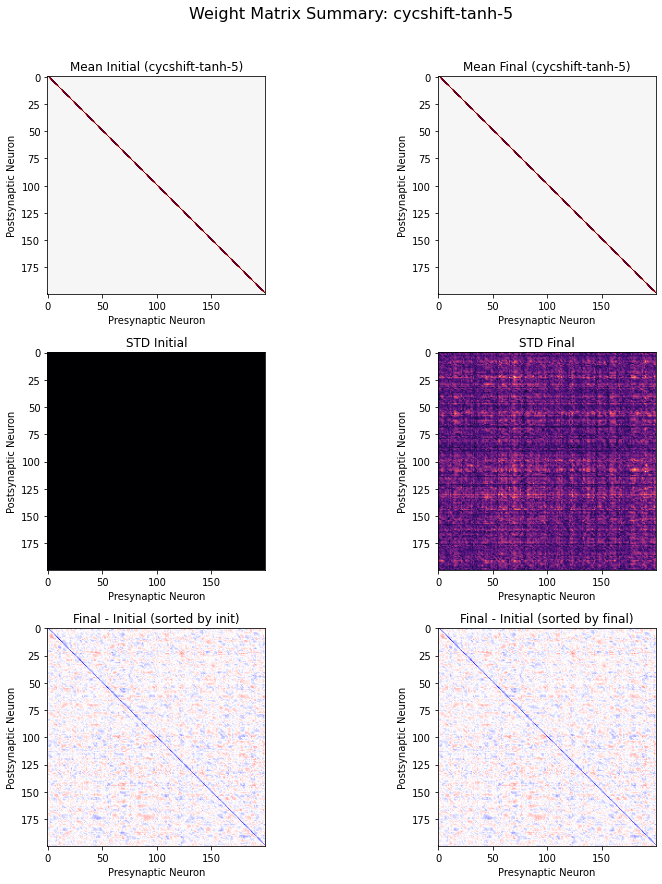

In [12]:
for label, paths in init_groups_5.items():
    W_init_avg, W_final_avg, std_init, std_final, delta_W = load_weight_matrices(paths)
    plot_weight_stats(
        W_init_avg, W_final_avg, std_init, std_final, delta_W, label=label
    )

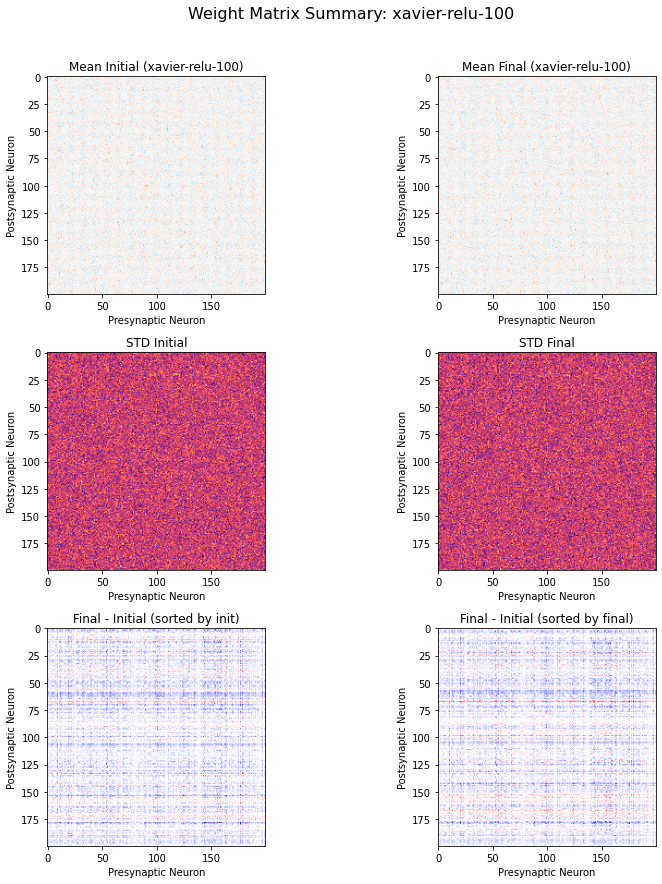

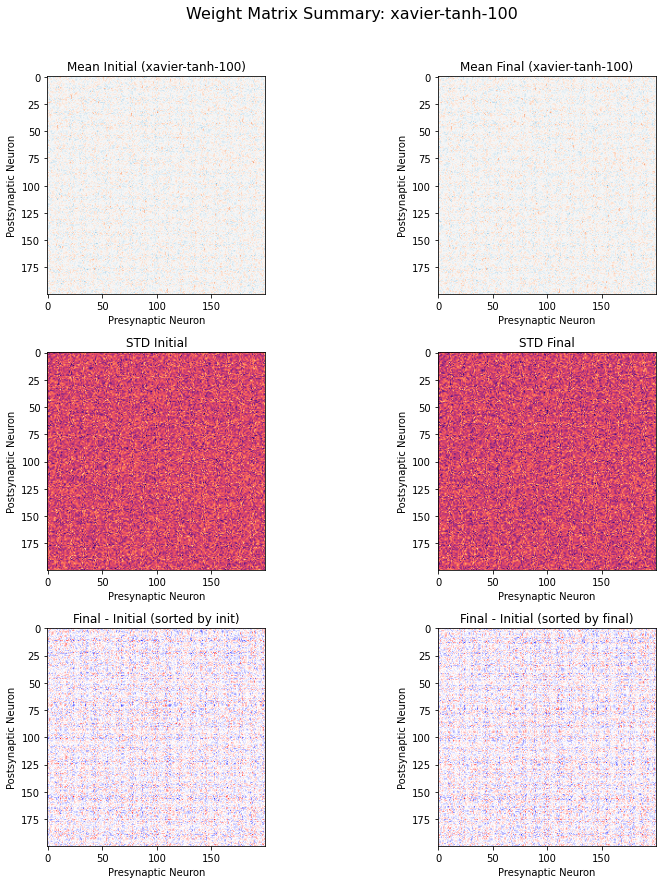

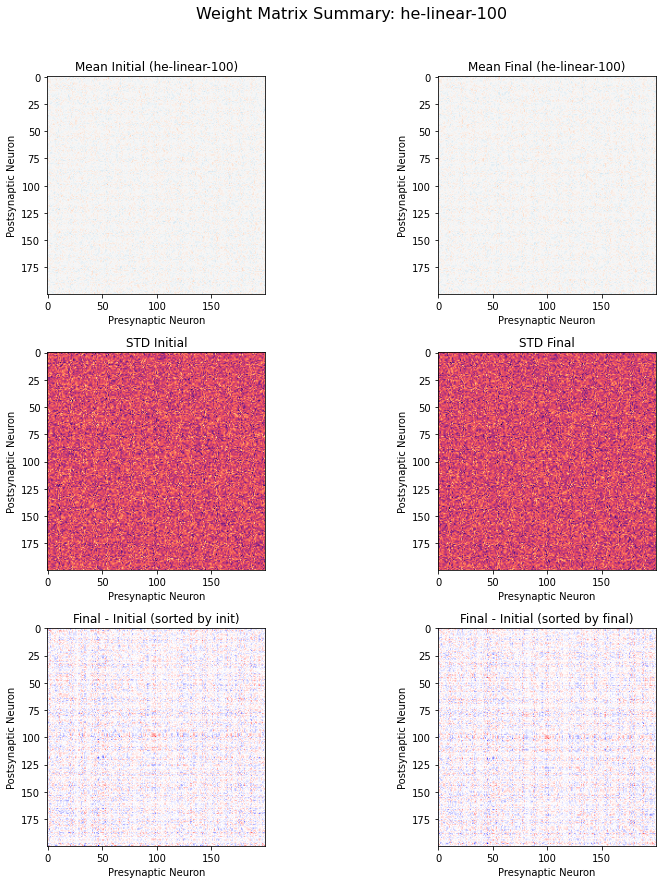

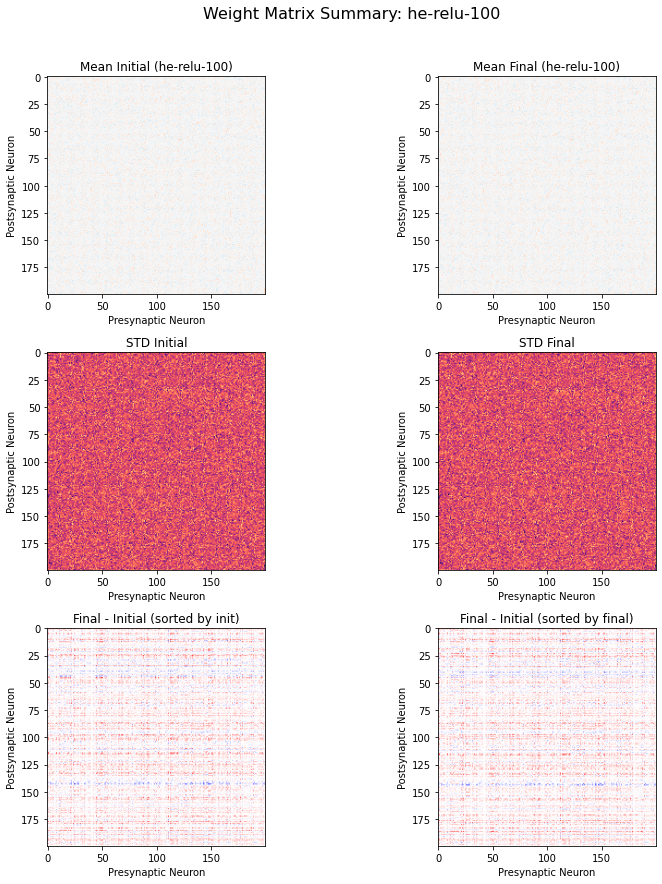

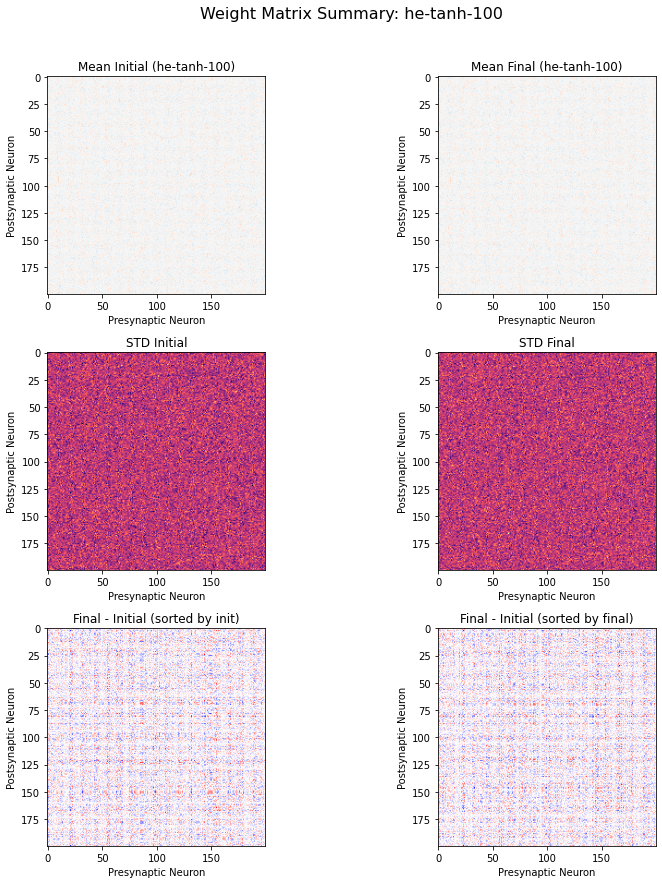

...

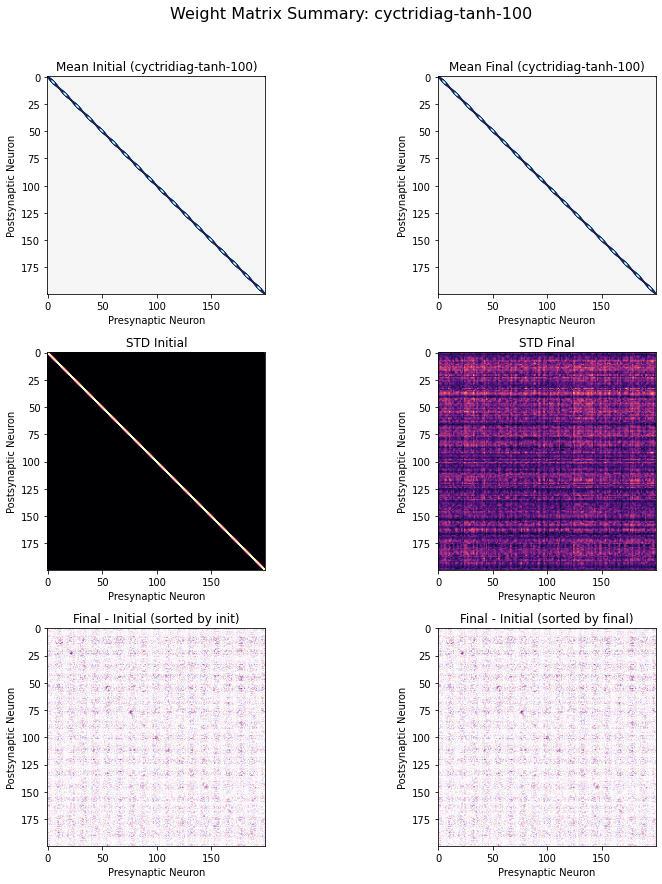

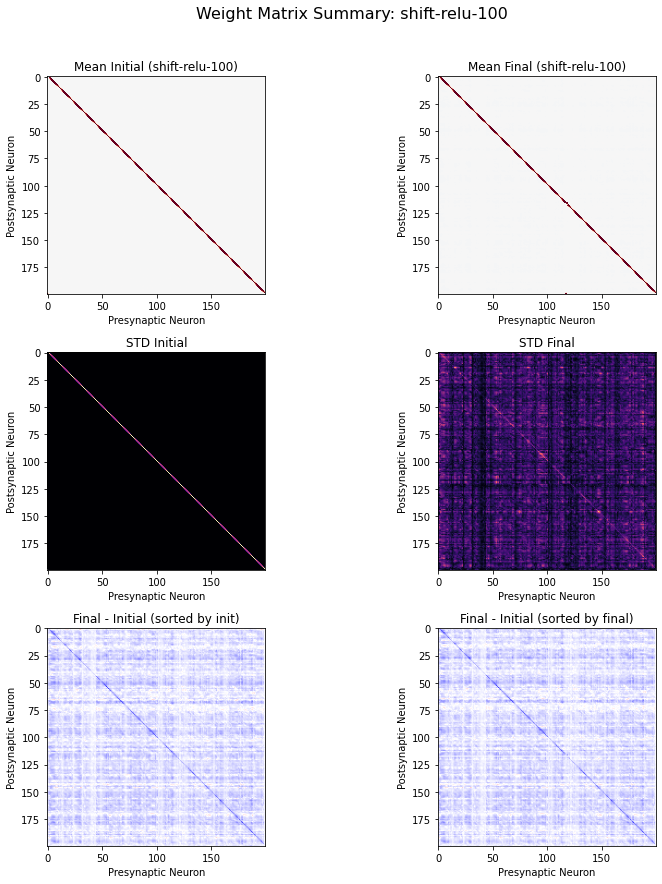

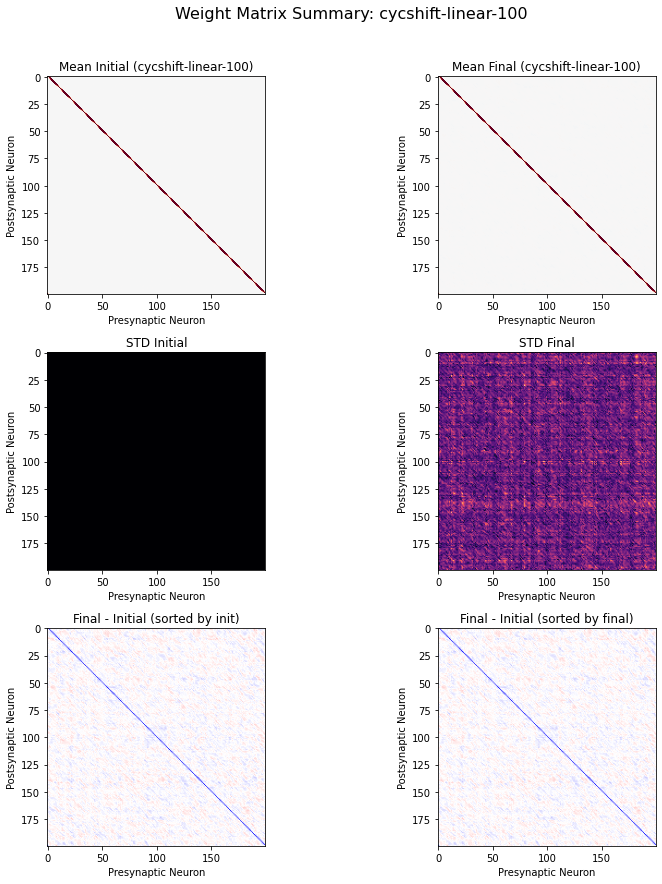

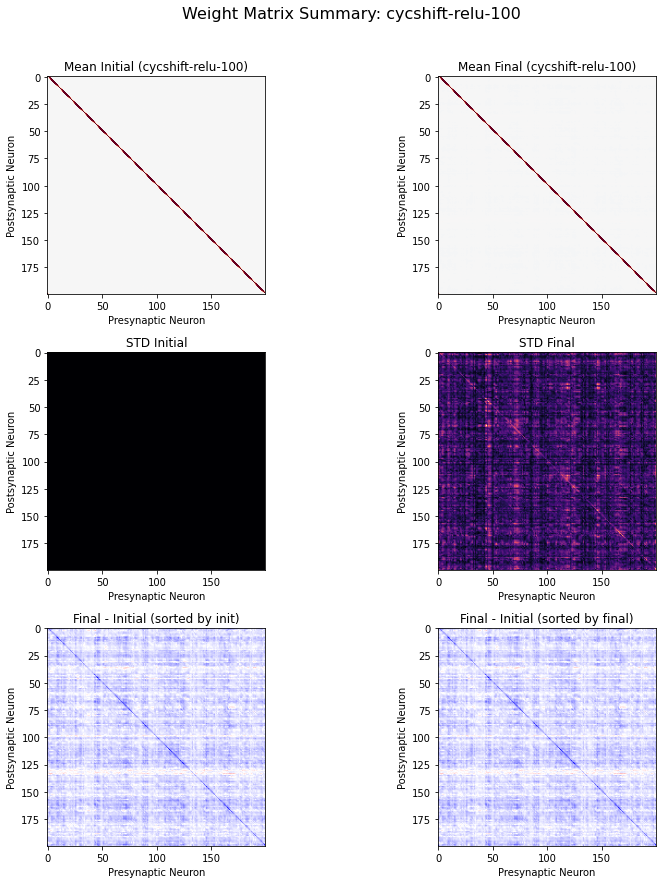

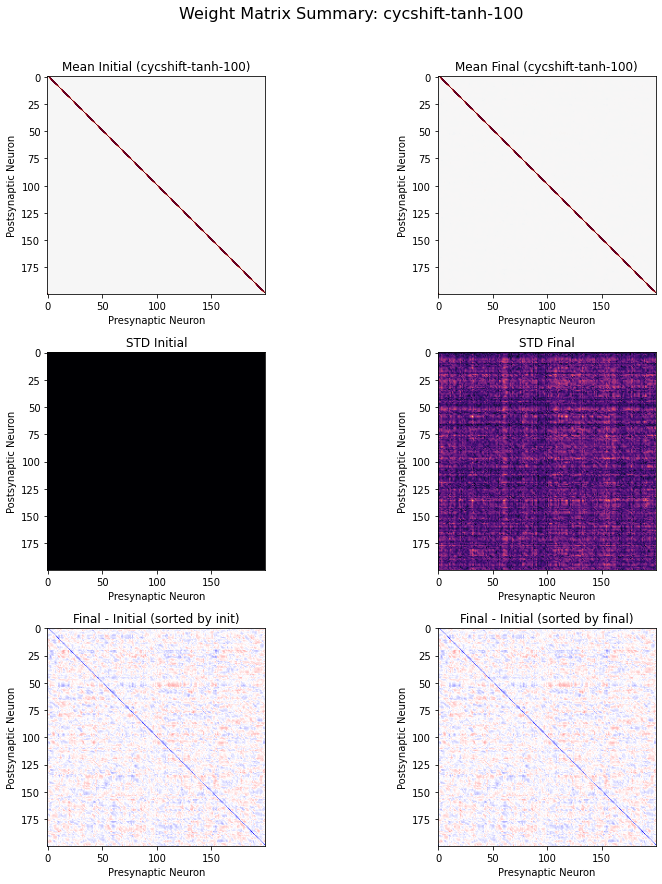

In [13]:
for label, paths in init_groups_100.items():
    W_init_avg, W_final_avg, std_init, std_final, delta_W = load_weight_matrices(paths)
    plot_weight_stats(
        W_init_avg, W_final_avg, std_init, std_final, delta_W, label=label
    )